https://www.youtube.com/watch?v=ML4udtQm55U&list=PLh9lJ0dC69jzYf6dwqLy3N4GtGSN7clgx&index=22

from 35:00

In [13]:
! pip install pillow opencv-python torch torchvision scikit-learn tqdm matplotlib pandas

   ---------------------------------------- 0.0/11.0 MB ? eta -:--:--
   -- ------------------------------------- 0.8/11.0 MB 4.8 MB/s eta 0:00:03
   -------- ------------------------------- 2.4/11.0 MB 5.8 MB/s eta 0:00:02
   --------------- ------------------------ 4.2/11.0 MB 6.8 MB/s eta 0:00:01
   ------------------------ --------------- 6.8/11.0 MB 8.4 MB/s eta 0:00:01
   ---------------------------------- ----- 9.4/11.0 MB 9.2 MB/s eta 0:00:01
   ---------------------------------------- 11.0/11.0 MB 9.0 MB/s eta 0:00:00

   ---------------------------------------- 0/3 [pytz]
   ---------------------------------------- 0/3 [pytz]
   ---------------------------------------- 0/3 [pytz]
   ---------------------------------------- 0/3 [pytz]
   ------------- -------------------------- 1/3 [tzdata]
   ------------- -------------------------- 1/3 [tzdata]
   ------------- -------------------------- 1/3 [tzdata]
   ------------- -------------------------- 1/3 [tzdata]
   ------------- -

In [19]:
import numpy as np
import cv2
import os
from datetime import datetime

from PIL import Image  # reading images

import torch
import torchvision

from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torch.utils.data import Dataset, DataLoader, Subset
import torchvision.transforms.functional as F

from sklearn.model_selection import train_test_split
from tqdm import tqdm

from matplotlib import pyplot as plt
import pickle   # to store model weights as pkl file and used for further inference 

import pandas as pd
import glob as glob
import random

Object detection is supervised problem 

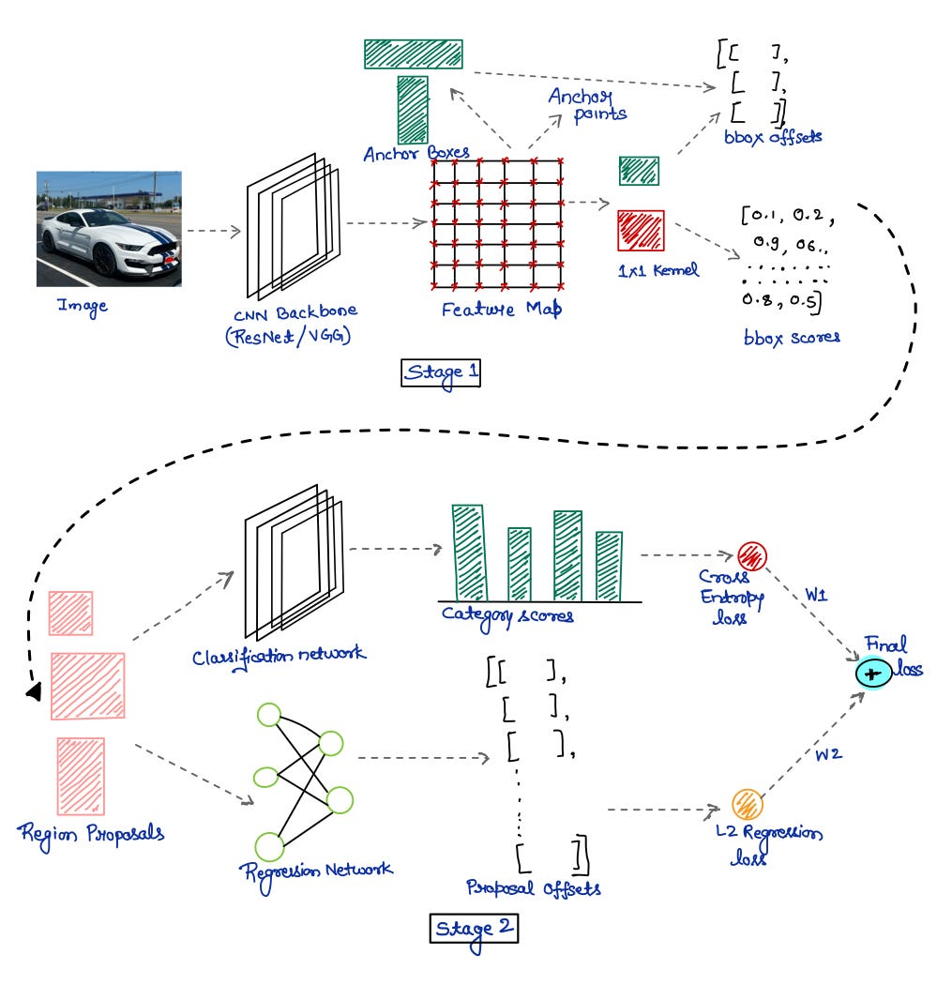

we are trying to regress the bounding box coordinates - regression 


In [21]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print("We use the following device: ", device)
# load a model; pre-trained on COCO -> coco = common objects in context dataset .. used for object detection 
# pytorch model is trained on coco v1
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(weights='COCO_V1').to(device)

We use the following device:  cpu


In [ ]:
# reads an image, normalizes and converts into a tensor 
def img_transform(img):
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float32)  # opencv always given in BGR format
          # pytorch always does things into RGB 
          # image pixel values are always int8 - converting them to float32
  img /= 255.0  # normalise
  img = torch.from_numpy(img).permute(2,0,1)   #transforms the tensor from (H, W, C) to (C, H, W). 
  return img

In [ ]:
def inference(img, model, detection_threshold=0.70):
  '''
  Infernece of a single input image

  inputs:
    img: input-image as torch.tensor (shape: [C, H, W])
    model: model for infernce (torch.nn.Module)
    detection_threshold: Confidence-threshold for NMS (default=0.7)

  returns:
    boxes: bounding boxes (Format [N, 4] => N times [xmin, ymin, xmax, ymax])
    labels: class-prediction (Format [N] => N times an number between 0 and _num_classes-1)
    scores: confidence-score (Format [N] => N times confidence-score between 0 and 1)
  '''
  model.eval()

  img = img.to(device)  # for cuda , everything has to be in same place 
  outputs = model([img])

  boxes = outputs[0]['boxes'].data.cpu().numpy()   # bounding box
  scores = outputs[0]['scores'].data.cpu().numpy() # confidence rate = this object is a person  
  labels = outputs[0]['labels'].data.cpu().numpy() # label = person or tree

  boxes = boxes[scores >= detection_threshold].astype(np.int32)  # has to be atleast 70 perc confident
  labels = labels[scores >= detection_threshold]
  scores = scores[scores >= detection_threshold]

  return boxes, scores, labels


In [18]:
import matplotlib.patches as patches

def plot_image(img, boxes, scores, labels, dataset, save_path=None):
  '''
  Function that draws the BBoxes, scores, and labels on the image.

  inputs:
    img: input-image as numpy.array (shape: [H, W, C])
    boxes: list of bounding boxes (Format [N, 4] => N times [xmin, ymin, xmax, ymax])
    scores: list of conf-scores (Format [N] => N times confidence-score between 0 and 1)
    labels: list of class-prediction (Format [N] => N times an number between 0 and _num_classes-1)
    dataset: list of all classes e.g. ["background", "class1", "class2", ..., "classN"] => Format [N_classes]
  '''

  # on top of image this will draw the bounding boxes and draw all the labels 

  cmap = plt.get_cmap("tab20b")
  class_labels = np.array(dataset)
  colors = [cmap(i) for i in np.linspace(0, 1, len(class_labels))]
  height, width, _ = img.shape
  # Create figure and axes
  fig, ax = plt.subplots(1, figsize=(16, 8))
  # Display the image
  ax.imshow(img)
  for i, box in enumerate(boxes):
    class_pred = labels[i]
    conf = scores[i]
    width = box[2] - box[0]
    height = box[3] - box[1]
    rect = patches.Rectangle(
        (box[0], box[1]),
        width,
        height,
        linewidth=2,
        edgecolor=colors[int(class_pred)],
        facecolor="none",
    )
    # Add the patch to the Axes
    ax.add_patch(rect)
    plt.text(
        box[0], box[1],
        s=class_labels[int(class_pred)] + " " + str(int(100*conf)) + "%",
        color="white",
        verticalalignment="top",
        bbox={"color": colors[int(class_pred)], "pad": 0},
    )

  # Used to save inference phase results
  if save_path is not None:
    plt.savefig(save_path)

  plt.show()


In [22]:
!wget https://www.uni-hannover.de/fileadmin/luh/studiengaenge/Produktion_und_Logistik_Master/produktion_und_logistik_master.jpg -q -O input.jpg
img = cv2.imread("./input.jpg")
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

'wget' is not recognized as an internal or external command,
operable program or batch file.


error: OpenCV(4.12.0) D:\a\opencv-python\opencv-python\opencv\modules\imgproc\src\color.cpp:199: error: (-215:Assertion failed) !_src.empty() in function 'cv::cvtColor'


In [ ]:
img = img_transform(img)
boxes, scores, labels = inference(img, model)

In [ ]:
!wget -O coco_labels.txt --no-check-certificate "https://docs.google.com/uc?export=download&id=1XHc_V7WBkn792_XO5zgQUxYpLLs3jYNX"

# labels from coco dataset 92 objects
# model is not going to detect anything outside of these 92 

# to detect anything beyond this .. we can fine tune if object is close enough 
# if too different , need to train using those models

--2025-05-13 11:22:16--  https://docs.google.com/uc?export=download&id=1XHc_V7WBkn792_XO5zgQUxYpLLs3jYNX
Resolving docs.google.com (docs.google.com)... 142.250.101.113, 142.250.101.100, 142.250.101.101, ...
Connecting to docs.google.com (docs.google.com)|142.250.101.113|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://drive.usercontent.google.com/download?id=1XHc_V7WBkn792_XO5zgQUxYpLLs3jYNX&export=download [following]
--2025-05-13 11:22:16--  https://drive.usercontent.google.com/download?id=1XHc_V7WBkn792_XO5zgQUxYpLLs3jYNX&export=download
Resolving drive.usercontent.google.com (drive.usercontent.google.com)... 74.125.137.132, 2607:f8b0:4023:c03::84
Connecting to drive.usercontent.google.com (drive.usercontent.google.com)|74.125.137.132|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 714 [application/octet-stream]
Saving to: ‘coco_labels.txt’

coco_labels.txt     100%[===================>]     714  --.-KB/s    in 0s  

In [ ]:
labels_path="coco_labels.txt"
with open(labels_path, "r") as coco:
  COCO_LABELS = coco.readlines()

for i, _ in enumerate(COCO_LABELS):
  COCO_LABELS[i] = COCO_LABELS[i].replace("\n", "")

In [ ]:
print(COCO_LABELS)

['background', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'street sign', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'hat', 'backpack', 'umbrella', 'shoe', 'eye glasses', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'plate', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'mirror', 'dining table', 'window', 'desk', 'toilet', 'door', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'blender', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush', 'hair brush']


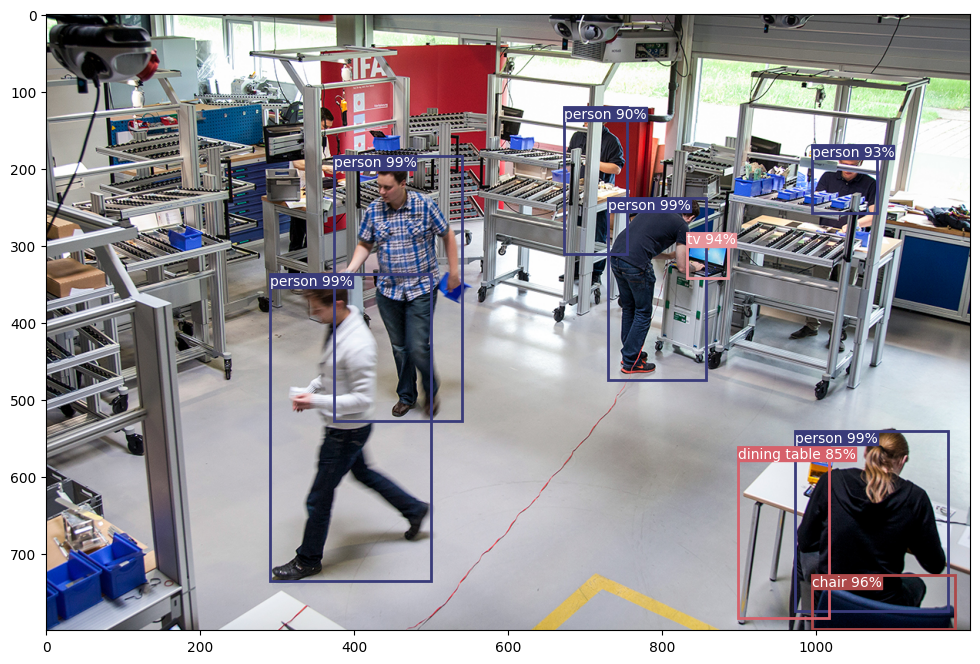

In [ ]:
img = img.cpu().permute(1,2,0).numpy()
plot_image(img, boxes, scores, labels, COCO_LABELS)

# Finetuning on New Data

In [ ]:
from google.colab import drive
drive.mount("/content/drive", force_remount=True)

Mounted at /content/drive


In [ ]:
!wget -nc https://s3.amazonaws.com/udacity-sdc/annotations/object-detection-crowdai.tar.gz
!tar xf object-detection-crowdai.tar.gz

# images downloaded

--2025-05-13 10:28:40--  https://s3.amazonaws.com/udacity-sdc/annotations/object-detection-crowdai.tar.gz
Resolving s3.amazonaws.com (s3.amazonaws.com)... 54.231.136.152, 52.217.231.104, 3.5.24.93, ...
Connecting to s3.amazonaws.com (s3.amazonaws.com)|54.231.136.152|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1650810880 (1.5G) [application/x-gzip]
Saving to: ‘object-detection-crowdai.tar.gz’

object-detection-cr 100%[===================>]   1.54G  54.6MB/s    in 31s     

2025-05-13 10:29:11 (51.1 MB/s) - ‘object-detection-crowdai.tar.gz’ saved [1650810880/1650810880]



In [ ]:
!wget https://raw.githubusercontent.com/udacity/self-driving-car/master/annotations/labels_crowdai.csv

# csv file with ground truth - bounding boxes , min max and label 

--2025-05-13 10:26:19--  https://raw.githubusercontent.com/udacity/self-driving-car/master/annotations/labels_crowdai.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7156250 (6.8M) [text/plain]
Saving to: ‘labels_crowdai.csv’

labels_crowdai.csv  100%[===================>]   6.82M  --.-KB/s    in 0.06s   

2025-05-13 10:26:20 (114 MB/s) - ‘labels_crowdai.csv’ saved [7156250/7156250]



In [ ]:
df = pd.read_csv('labels_crowdai.csv')

In [ ]:
path_csv = 'labels_crowdai.csv'
img_dir = 'object-detection-crowdai'
print("Number of total bounding boxes: ", len(df))

image_paths = glob.glob(f"{img_dir}/*.jpg")
all_images = [image_path.split(os.path.sep)[-1] for image_path in image_paths]
all_images = sorted(all_images)
print("Number of unique images: ", len(all_images))

Number of total bounding boxes:  72064
Number of unique images:  9420


In [ ]:
'''
Class that holds all the augmentation related attributes
'''

# image augmentation codes 


class Transformation():
    # This provides a random probability of the augmentation to be applied or not
    def get_probability(self):
        return np.random.choice([False, True], replace=False, p=[0.5, 0.5])

    # Increases the contrast by a factor of 2
    def random_adjust_contrast(self, image, enable=None):
        enable = self.get_probability() if enable is None else enable
        return F.adjust_contrast(image, 2) if enable else image

    # Increaes the brightness by a factor of 2
    def random_adjust_brightness(self, image, enable=None):
        enable = enable = self.get_probability() if enable is None else enable
        return F.adjust_brightness(image,2) if enable else image

    # Horizontal flip
    def random_hflip(self, image, boxes, enable=None):
        enable = enable = self.get_probability() if enable is None else enable
        if enable:
          #flip image
          new_image = F.hflip(image)

          #flip boxes
          new_boxes = boxes.clone()
          new_boxes[:, 0] = image.shape[2] - boxes[:, 0]  # image width - xmin
          new_boxes[:, 2] = image.shape[2] - boxes[:, 2]  # image_width - xmax
          new_boxes = new_boxes[:, [2, 1, 0, 3]]          # Interchange the xmin and xmax due to mirroring
          return new_image, new_boxes
        else:
          return image, boxes


In [ ]:
class vehicleDataset(Dataset):
  def __init__(self, img_path, label_path, classes, transforms=None):
    super().__init__()
    print("Preparing the dataset...")

    self.image_dir = img_path
    self.gt_info = pd.read_csv(label_path)
    self.classes = classes
    self.transforms = transforms

    # Create a list of image file names (in sorted order - this is optional)

    # dataloader = convert individual image to a batched image
    self.image_paths = glob.glob(f"{img_path}/*.jpg")
    all_images = [image_path.split(os.path.sep)[-1] for image_path in self.image_paths]
    self.all_images = sorted(all_images)

    # Map Label (str) --> Label (int)
    for i in range(len(self.gt_info)):
      label = self.gt_info.loc[i, 'Label']
      self.gt_info.loc[i, ['Label']] = self.classes.index(label)

    # Filter the dataset based on given conditions:
    self.filter_dataset()
    print("Dataset prepared")

  def __getitem__(self, idx):
    target = {}

    # Read input image
    image_name = self.all_images[idx]
    image_path = os.path.join(self.image_dir, image_name)
    image = cv2.imread(image_path)
    image = img_transform(image)

    # Fetch GT infos for given image
    gt_info = self.gt_info[self.gt_info['Frame'] == image_name]

    boxes = torch.Tensor(gt_info[['xmin', 'ymin', 'xmax', 'ymax']].values).float()
    labels = torch.LongTensor(gt_info['Label'].values.tolist())

    if self.transforms:
        image = self.transforms.random_adjust_contrast(image, enable=True)
        image = self.transforms.random_adjust_brightness(image, enable=True)
        image, boxes = self.transforms.random_hflip(image, boxes, enable=True)

    target["boxes"] = boxes     # Hint: Shape -> [N, 4] with N = Number of Boxes
    target["labels"] = labels   # Hint: Shape -> [N] with N = Number of Boxes

    return image, target

  def __len__(self):
    return len(self.all_images)

  '''
  Filter the dataset by removing images with no labels and incorrect bounding boxes
  '''
  def filter_dataset(self):
    print("Filtering the dataset...")
    remove_images = []

    # There are no labels for some images because they show an 'empty' scene → these images should be filtered out.
    for image_file in self.all_images.copy():
      if image_file not in self.gt_info['Frame'].values:
        remove_images.append(image_file)
        self.all_images.remove(image_file)
    print("Images removed with no labels: ", len(remove_images))

    # There are incorrect bounding boxes in the dataset (e.g. xmax=xmin).
    valid_box_mask = (self.gt_info['xmax'] - self.gt_info['xmin'] > 0) & (self.gt_info['ymax'] - self.gt_info['ymin'] > 0)
    print("Images removed with incorrect bounding boxes: ", len(self.gt_info) - valid_box_mask.shape[0])
    self.gt_info = self.gt_info[valid_box_mask] # TODO: correct this masking

Preparing the dataset...
Filtering the dataset...
Images removed with no labels:  202
Images removed with incorrect bounding boxes:  0
Dataset prepared
Image index:  738


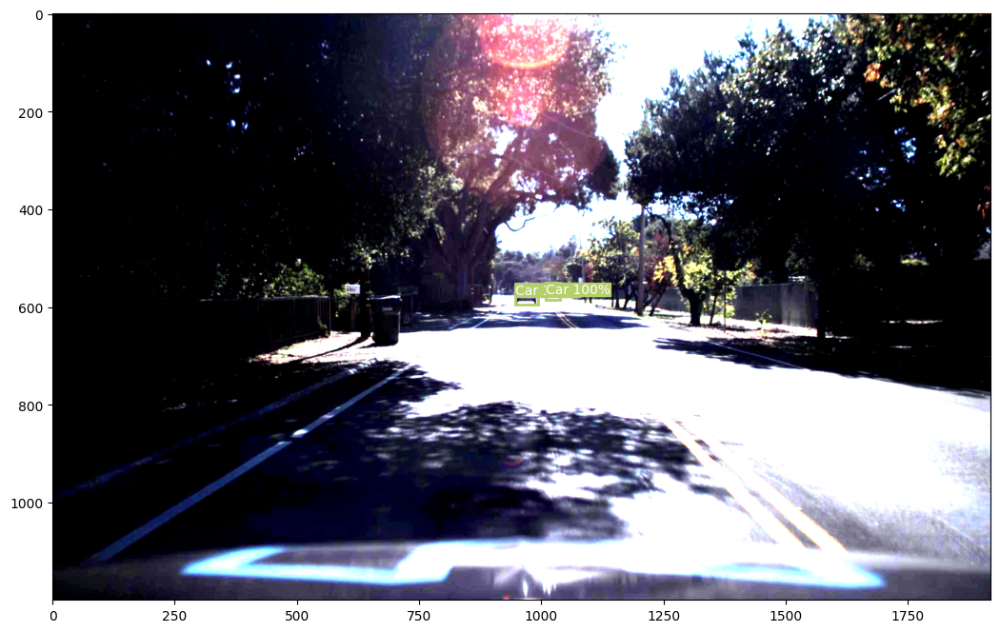

Image index:  7460


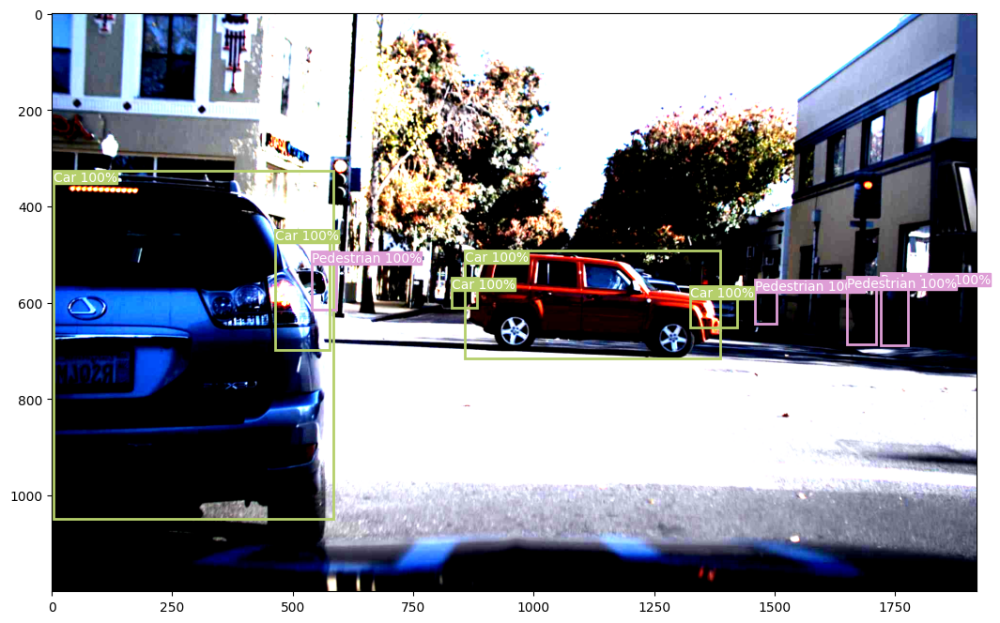

Image index:  3057


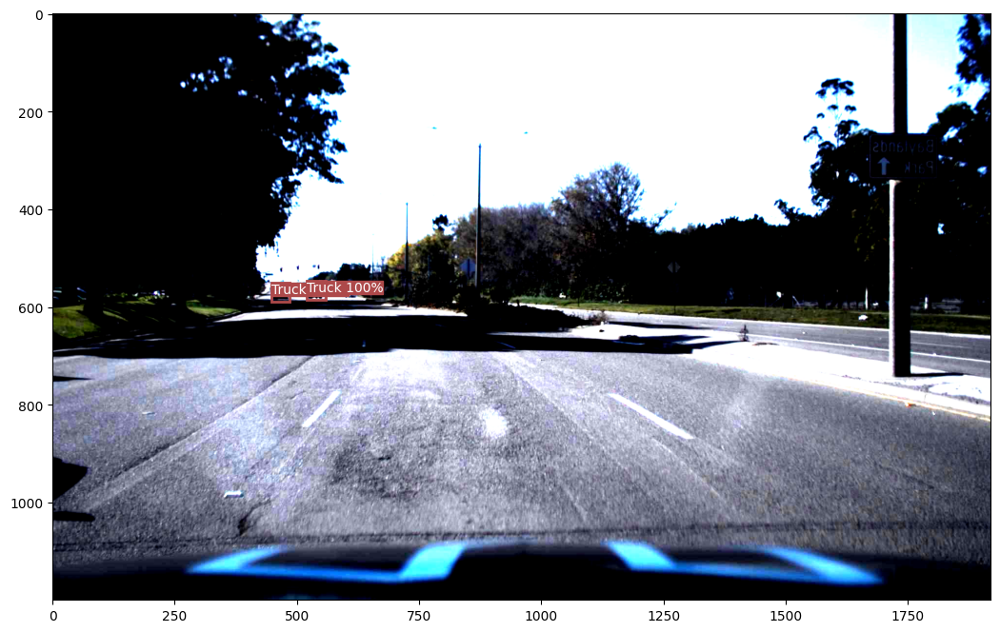

Image index:  3833


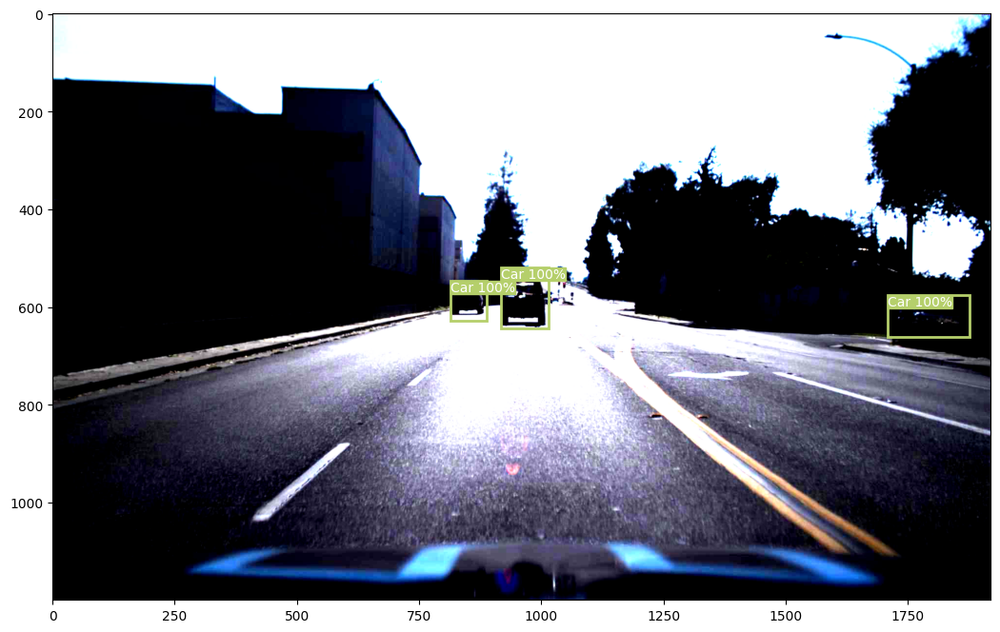

Image index:  2529


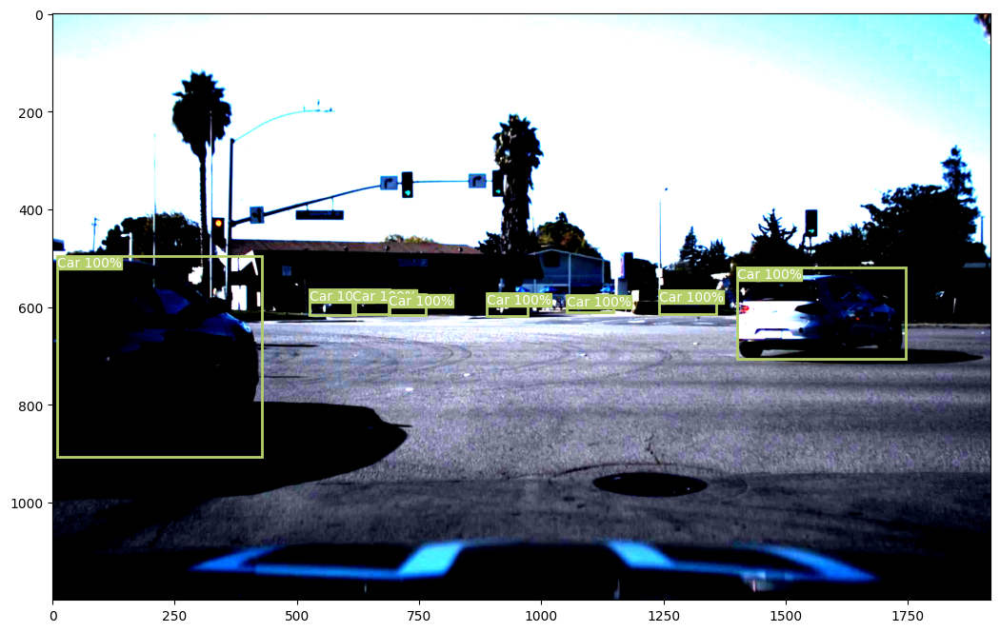

In [ ]:
crowdai = ["Background", "Car", "Truck", "Pedestrian"]
dataset = vehicleDataset(img_dir, path_csv, crowdai, transforms=Transformation()) # here your arguments
num_images = 5

for _ in range(num_images):
  x = random.randint(0, (dataset.__len__()-1))
  img, target = dataset.__getitem__(x)
  img = img.cpu().permute(1,2,0).numpy()
  boxes = target['boxes'].numpy()
  labels = target['labels'].numpy()
  scores = [1]*len(labels)
  print("Image index: ", x)
  plot_image(img, boxes, scores, labels, crowdai)

In [ ]:
# Hyperparameters

SEED = 42

TEST_SIZE = 0.2

NUM_EPOCHS = 5

LR = 0.005
LR_MOMENTUM=0.9
LR_DECAY_RATE=0.0005

LR_SCHED_STEP_SIZE = 0.1
LR_SCHED_GAMMA = 0.1

BATCH_SIZE = 16   # this is tor T4 in colab , in local can change this 

NUM_TEST_IMAGES = 5
NMS_THRESH = 0.01


In [ ]:
current_dir = "/content/drive/MyDrive/applied_machine_learning_virtusa/object_detection"

# Fetch current date and time
now = datetime.now()
dt_string = now.strftime("%d-%m-%Y-%H-%M-%S")
output_dir_name = "output-" + dt_string

OUTPUT_DIR = os.path.join(current_dir, output_dir_name)
os.makedirs(OUTPUT_DIR, exist_ok=True)


In [24]:
crowdai = ["Background", "Car", "Truck", "Pedestrian"]

device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

model = torchvision.models.detection.fasterrcnn_resnet50_fpn(min_size=300, max_size=480, pretrained=True)
num_classes = 4  # 3 classes + background
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
model.to(device)

num_epochs = NUM_EPOCHS

# construct an optimizer
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=LR, momentum=LR_MOMENTUM, weight_decay=LR_DECAY_RATE)

# create a train- and validation-dataset with our vehicleDataset
# split the dataset in train and test set
dataset = vehicleDataset(img_dir, path_csv, crowdai, transforms=Transformation())      # here your arguments
dataset_test = vehicleDataset(img_dir, path_csv, crowdai, transforms=None)             # here your arguments

torch.manual_seed(SEED)
indices = torch.randperm(len(dataset)).tolist()

test_size = int(len(dataset) * TEST_SIZE)
dataset = torch.utils.data.Subset(dataset, indices[:-test_size])
dataset_test = torch.utils.data.Subset(dataset_test, indices[-test_size:])

# create a learning rate scheduler
# TODO: step size to be tuned !
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, \
                                                step_size=LR_SCHED_STEP_SIZE, \
                                                gamma=LR_SCHED_GAMMA)

def collate_fn(batch):
  return tuple(zip(*batch))

# define training and validation data loaders
data_loader = torch.utils.data.DataLoader(
  dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2,
  collate_fn=collate_fn)

data_loader_test = torch.utils.data.DataLoader(
  dataset_test, batch_size=1, shuffle=False, num_workers=2,
  collate_fn=collate_fn)

d:\Documents\Github\masters-practise-repo\.venv\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\Documents\Github\masters-practise-repo\.venv\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


NameError: name 'NUM_EPOCHS' is not defined

In [ ]:
'''
Function to train the model over one epoch.
'''
def train_one_epoch(model, optimizer, data_loader, device, epoch):
  train_loss_list = []

  tqdm_bar = tqdm(data_loader, total=len(data_loader))
  for idx, data in enumerate(tqdm_bar):
    optimizer.zero_grad()
    images, targets = data

    images = list(image.to(device) for image in images)
    targets = [{k: v.to(device) for k, v in t.items()} for t in targets]  # targets = {'boxes'=tensor, 'labels'=tensor}

    losses = model(images, targets)

    loss = sum(loss for loss in losses.values())
    loss_val = loss.item()
    train_loss_list.append(loss.detach().cpu().numpy())

    loss.backward()
    optimizer.step()

    tqdm_bar.set_description(desc=f"Training Loss: {loss:.3f}")

  return train_loss_list

'''
Function to validate the model
'''
def evaluate(model, data_loader_test, device):
    val_loss_list = []

    tqdm_bar = tqdm(data_loader_test, total=len(data_loader_test))

    for i, data in enumerate(tqdm_bar):
        images, targets = data

        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        with torch.no_grad():
            losses = model(images, targets)

        loss = sum(loss for loss in losses.values())
        loss_val = loss.item()
        val_loss_list.append(loss_val)

        tqdm_bar.set_description(desc=f"Validation Loss: {loss:.4f}")
    return val_loss_list

'''
Function to plot training and valdiation losses and save them in `output_dir'
'''
def plot_loss(train_loss, valid_loss):
    figure_1, train_ax = plt.subplots()
    figure_2, valid_ax = plt.subplots()

    train_ax.plot(train_loss, color='blue')
    train_ax.set_xlabel('Iteration')
    train_ax.set_ylabel('Training Loss')

    valid_ax.plot(valid_loss, color='red')
    valid_ax.set_xlabel('Iteration')
    valid_ax.set_ylabel('Validation loss')

    figure_1.savefig(f"{OUTPUT_DIR}/train_loss.png")
    figure_2.savefig(f"{OUTPUT_DIR}/valid_loss.png")


----------Epoch 1----------


Validation Loss: 0.9952: 100%|██████████| 1843/1843 [02:59<00:00, 10.25it/s]


----------Epoch 2----------


Validation Loss: 0.9432: 100%|██████████| 1843/1843 [03:02<00:00, 10.07it/s]


----------Epoch 3----------


Validation Loss: 1.0948: 100%|██████████| 1843/1843 [03:00<00:00, 10.21it/s]


----------Epoch 4----------


Validation Loss: 1.0894: 100%|██████████| 1843/1843 [03:02<00:00, 10.11it/s]


----------Epoch 5----------


Validation Loss: 0.9903: 100%|██████████| 1843/1843 [03:08<00:00,  9.80it/s]


Training Finished !


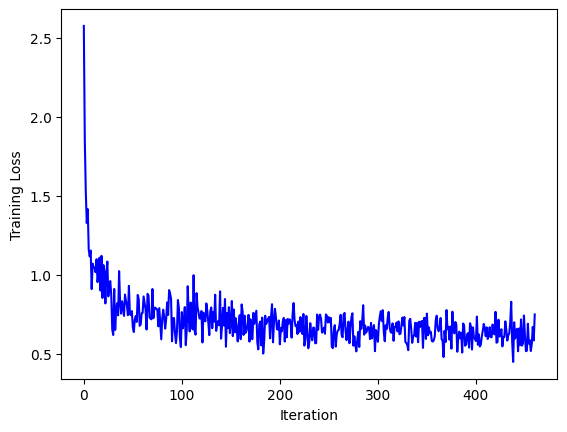

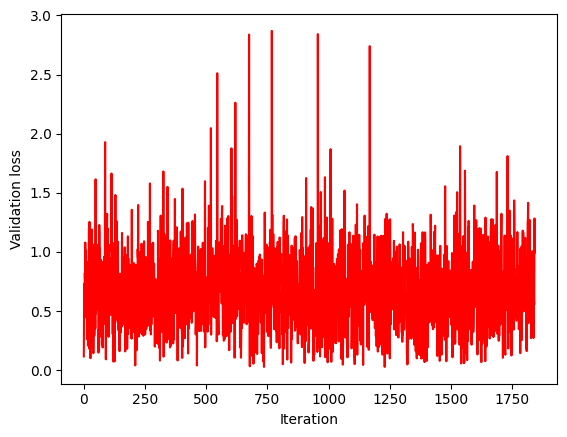

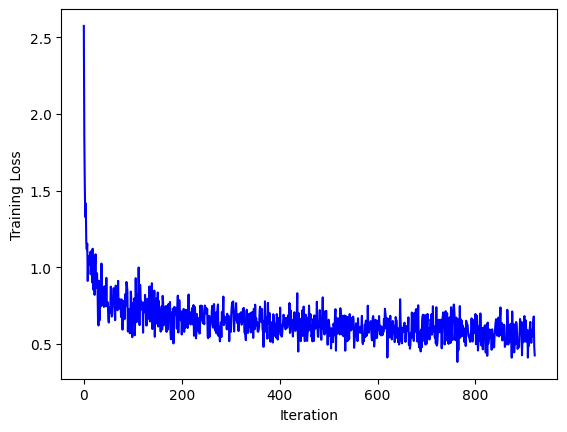

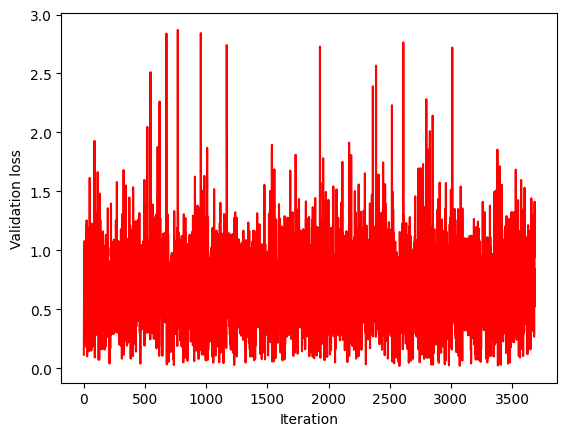

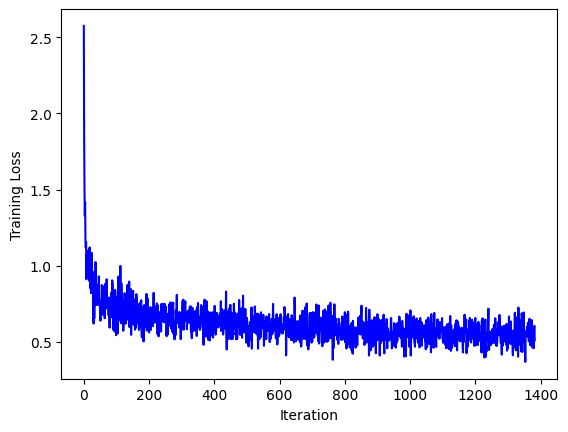

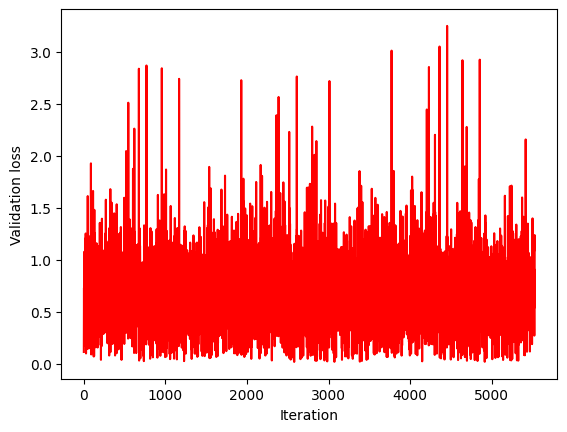

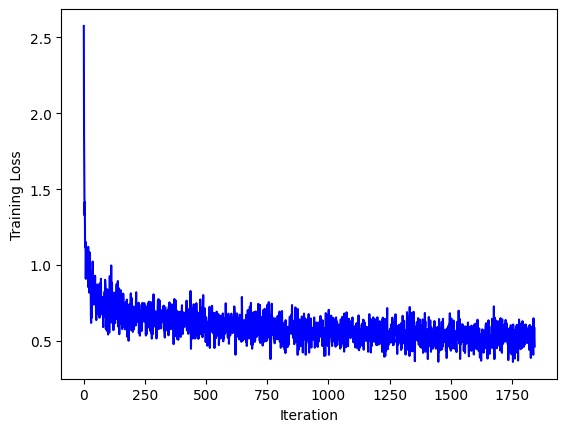

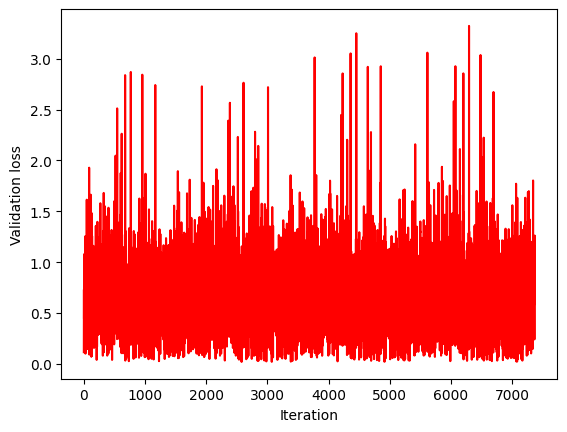

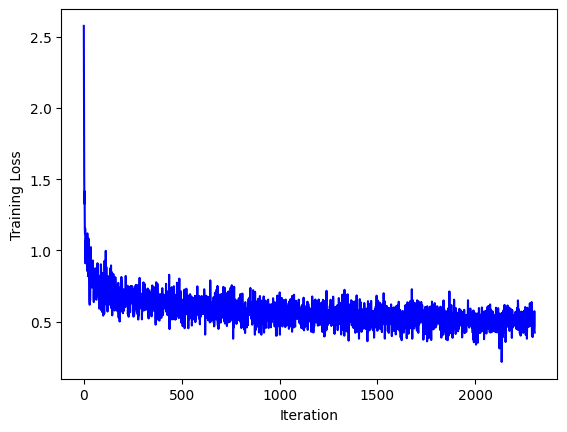

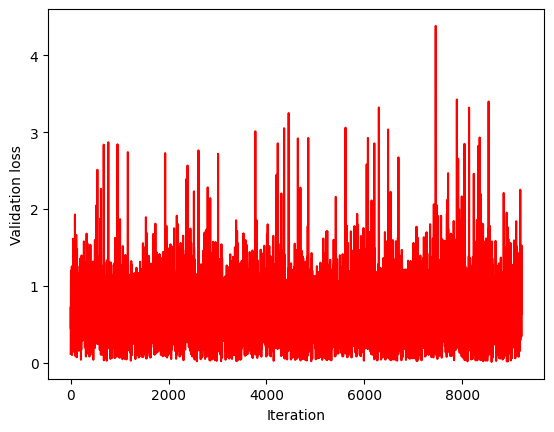

In [ ]:
# find latest saved chcekpoint
checkpoint_files = [f for f in os.listdir(OUTPUT_DIR) if f.endswith('.pth')]
if checkpoint_files:
    # Last ckpt file
    checkpoint_files.sort()
    latest_checkpoint = os.path.join(OUTPUT_DIR, checkpoint_files[-1])

    # Load the ckpt
    checkpoint = torch.load(latest_checkpoint)
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    start_epoch = checkpoint['epoch']
    loss_dict = checkpoint['loss_dict']
else:
    start_epoch = 0
    loss_dict = {'train_loss': [], 'valid_loss': []}

'''
Train the model over all epochs
'''
for epoch in range(start_epoch, num_epochs):
  print("----------Epoch {}----------".format(epoch+1))

  # Train the model for one epoch
  train_loss_list = train_one_epoch(model, optimizer, data_loader, device, epoch)
  loss_dict['train_loss'].extend(train_loss_list)

  lr_scheduler.step()

  # Run evaluation
  valid_loss_list = evaluate(model, data_loader_test, device)
  loss_dict['valid_loss'].extend(valid_loss_list)

  # Svae the model ckpt after every epoch
  ckpt_file_name = f"{OUTPUT_DIR}/epoch_{epoch+1}_model.pth"
  torch.save({
    'epoch': epoch+1,
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'loss_dict': loss_dict
  }, ckpt_file_name)

  # NOTE: The losses are accumulated over all iterations
  plot_loss(loss_dict['train_loss'], loss_dict['valid_loss'])

# Store the losses after the training in a pickle
with open(f"{OUTPUT_DIR}/loss_dict.pkl", "wb") as file:
    pickle.dump(loss_dict, file)

print("Training Finished !")


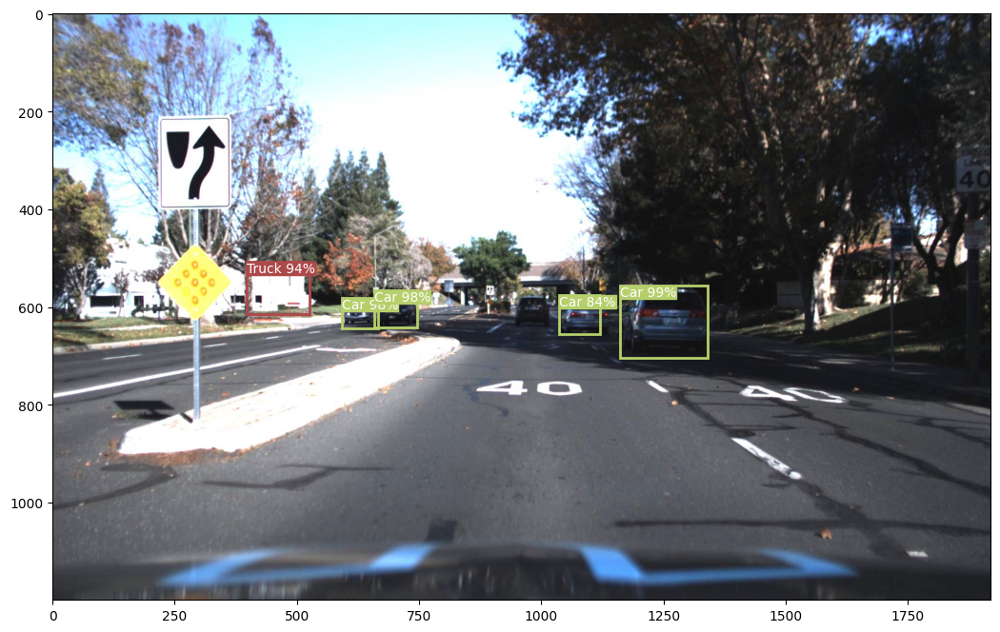

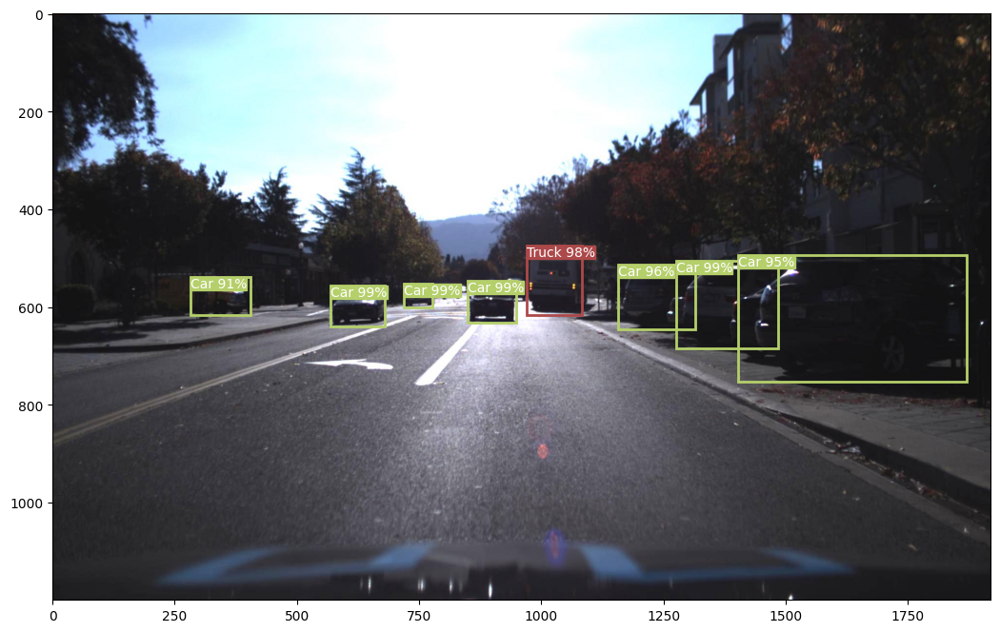

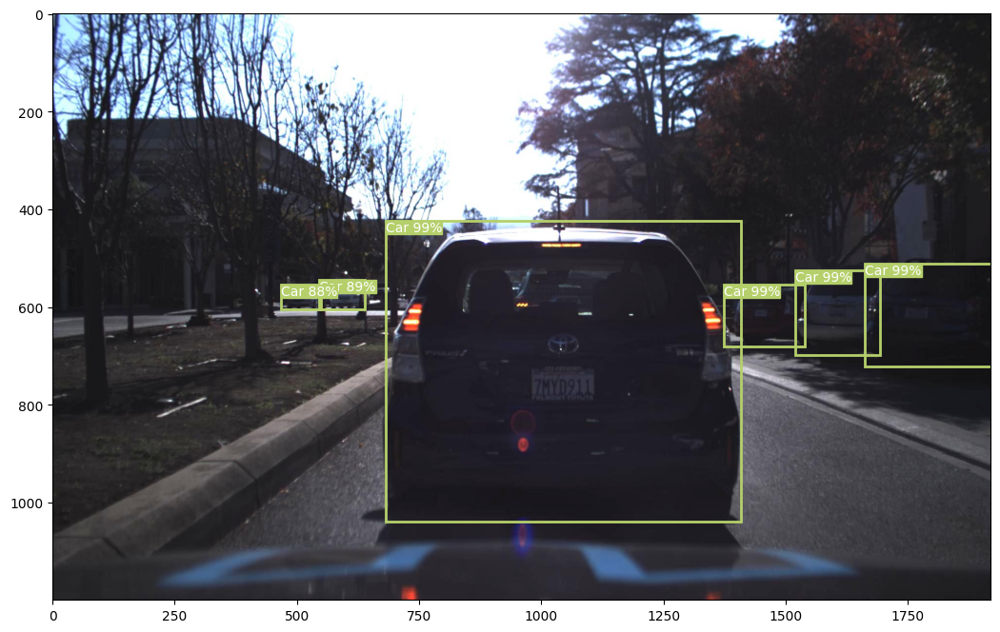

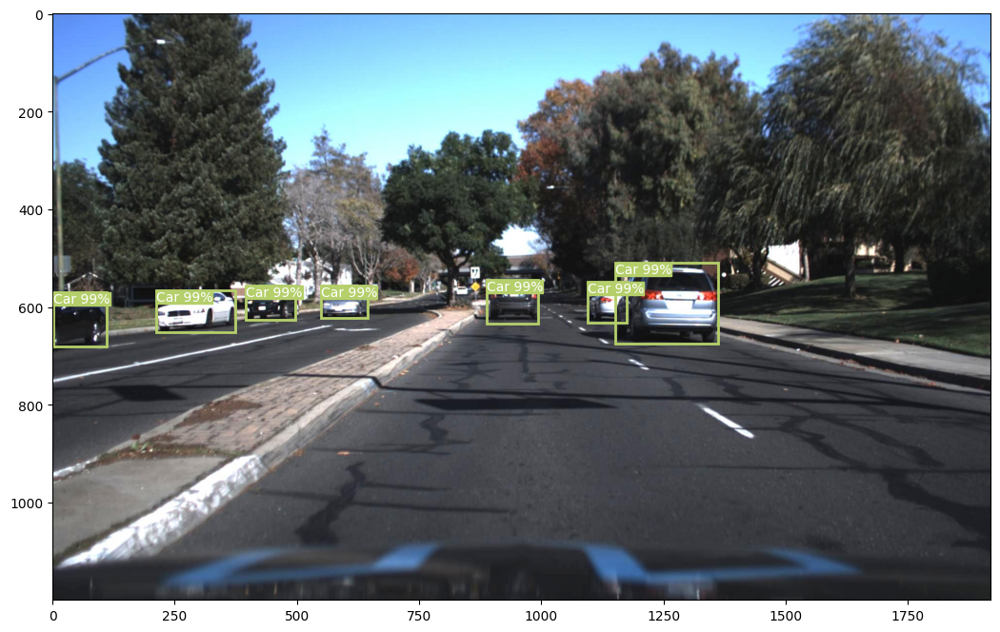

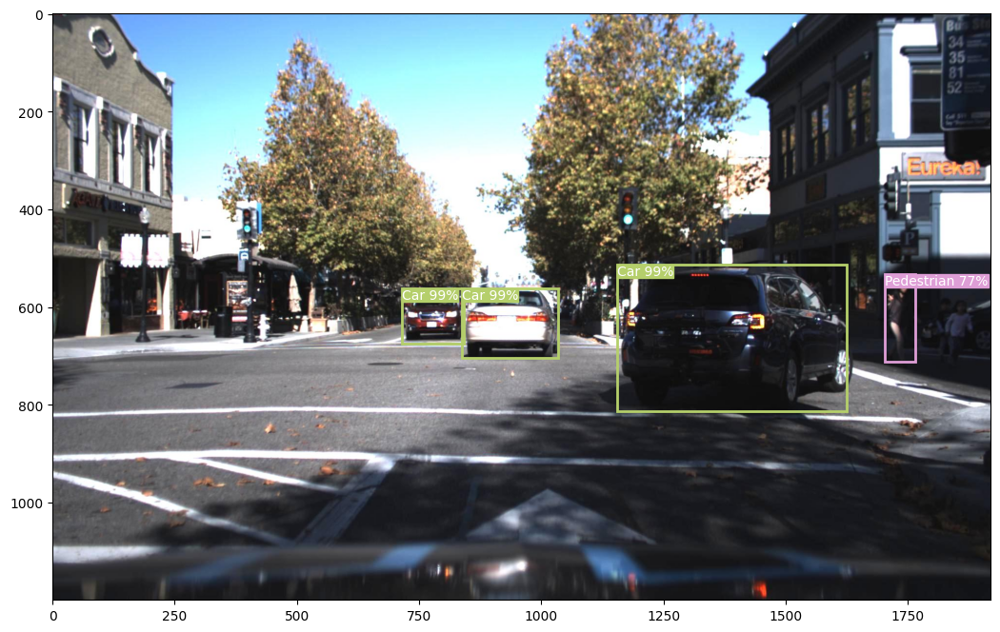

In [ ]:


random.seed(SEED)
crowdai = ["Background", "Car", "Truck", "Pedestrian"]
num_images = NUM_TEST_IMAGES

for _ in range(num_images):
  x = random.randint(0, (dataset_test.__len__()-1))
  img, target = dataset_test.__getitem__(x)
  img = img.to(device)

  # Load last checkpoint
  # CHANGE THE OUTPUT_DIR IF CKPT IS STORED ELSEWHERE
  checkpoint_dir = f"/{OUTPUT_DIR}/epoch_5_model.pth"
  checkpoint = torch.load(checkpoint_dir, map_location=device)
  model.load_state_dict(checkpoint['model_state_dict'])

  boxes, scores, labels = inference(img, model)

  img = img.squeeze(0).cpu().permute(1,2,0).numpy()
  plot_image(img, boxes, scores, labels, crowdai, save_path=f"{OUTPUT_DIR}/inference_{x}.png")